In [1]:
%load_ext autoreload
%autoreload 2
%pylab inline

Populating the interactive namespace from numpy and matplotlib


## Import module

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import torch
import os
from torchsummary import summary
from torchvision import transforms                                                                                                                                        
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600
from PIL import Image

import sys
sys.path.append("../../")
sys.path.append("../../../src/")
import model
from datasets import imagenet
import config
from aux.utils import obtain_features_map, load_imgs, zscore, extract_valid
from aux.visualization import visualize_features_map_for_comparision

## Hyperparameter

resume = "037-0"
model_dir = "/home/lincolnzjx/Desktop/Interpretation/saved/models"
generated_dir = "/home/lincolnzjx/Desktop/Interpretation/saved/generated/"
backbone = "vgg16"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

selected_layer = 1 
img_index = 0
exp = "052490"
epoch = "46785"

## Load modal from dict

In [4]:
# model
net = model.Network(backbone=backbone, num_classes=1000, 
                    selected_layer=selected_layer)
net.to(device)

# resume from model
resume_exp = resume.split("-")[0]
resume_epoch = resume.split("-")[1]
print("Resume from model from exp: {} at epoch {}".format(resume_exp, resume_epoch))
resume_path = os.path.join(model_dir, str(resume_exp), str(resume_epoch))
ckpt = torch.load(resume_path, map_location=device)
net.load_state_dict(ckpt, strict=False) 

Only Keep 1th layers before.
Resume from model from exp: 037 at epoch 0


_IncompatibleKeys(missing_keys=[], unexpected_keys=['model.fc.0.weight', 'model.fc.0.bias', 'model.fc.3.weight', 'model.fc.3.bias', 'model.fc.6.weight', 'model.fc.6.bias', 'model.features.2.weight', 'model.features.2.bias', 'model.features.5.weight', 'model.features.5.bias', 'model.features.7.weight', 'model.features.7.bias', 'model.features.10.weight', 'model.features.10.bias', 'model.features.12.weight', 'model.features.12.bias', 'model.features.14.weight', 'model.features.14.bias', 'model.features.17.weight', 'model.features.17.bias', 'model.features.19.weight', 'model.features.19.bias', 'model.features.21.weight', 'model.features.21.bias', 'model.features.24.weight', 'model.features.24.bias', 'model.features.26.weight', 'model.features.26.bias', 'model.features.28.weight', 'model.features.28.bias'])

In [5]:
summary(net, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
             VGG16-3         [-1, 64, 224, 224]               0
Total params: 1,792
Trainable params: 1,792
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.57
Forward/backward pass size (MB): 73.50
Params size (MB): 0.01
Estimated Total Size (MB): 74.08
----------------------------------------------------------------


## Load Original Data 

In [6]:
# Load data
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
reverse_mean = [-0.485, -0.456, -0.406]
reverse_std = [1/0.229, 1/0.224, 1/0.225]
train_transform = None
train_transform = transforms.Compose([                                                                                                                                
    transforms.Resize((224, 224), interpolation=Image.BILINEAR),                                                                                              
    # transforms.RandomCrop(input_size),                                                                                                                              
    # transforms.RandomHorizontalFlip(),                                                                                                                              
    # transforms.ColorJitter(brightness=0.4, saturation=0.4, hue=0.4),                                                                                                
    transforms.ToTensor(),                                                                                                                                            
    transforms.Normalize(mean, std)                                                                                                                                   
       ])         
trainset = imagenet.ImageNet(root="/media/lincolnzjx/HardDisk/Datasets/", is_train=True, transform=train_transform)

trainset.set_data([950], 30)
#image, label, imgs_path = trainset
imgs_path = []                                                                                                                                                            
images = []
labels = []
for img, label, img_path in trainset:                                                                                                                                     
    images.append(img.unsqueeze(0))                                                                                                                                       
    labels.append(label)                                                                                                                                                  
    imgs_path.append(img_path)  

images = [images[img_index]]
labels = [labels[img_index]]
print(imgs_path[img_index])
imgs_path = [imgs_path[img_index]]

Len of new dataset is :30
/media/lincolnzjx/HardDisk/Datasets/ilsvrc2012/train/n07747607/n07747607_10061.JPEG


## Load optimized data from given path

In [7]:
save_dir = "/home/lincolnzjx/Desktop/Interpretation/saved/pack/"
################### Hyper-Parameter #######################
#!!
# exp = "052400"
# epoch = "67715"
##########################################################
ab_path = os.path.join(save_dir, exp, epoch)

In [8]:
# Load image
optimized_data, valid_imgs_path, valid_imgs_index = load_imgs(ab_path, imgs_path, non_exists_ok=True)
valid_imgs, valid_labels = extract_valid(images, labels, valid_imgs_index)
optimized_data = zscore(optimized_data, mean, std)

Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052500/35900/n07747607_10061.png


In [9]:
index2image = {index: item.split("/")[-1].split(".")[0] for index, item in enumerate(valid_imgs_path)}
index2image

{0: 'n07747607_10061'}

In [10]:
save_dict = None

In [11]:
# Move to device
#optimized_data = np.load(os.path.join(ab_path, epoch+".npy"))
opt_image = torch.from_numpy(optimized_data).to(device)
original_image = torch.cat(valid_imgs, dim=0).to(device)

## 4. Obtain feature from conv layers.

In [12]:
# hyper parameter
conv_output_indexes = [1, 3, 6, 8, 11, 13, 15, 18, 20, 22, 25, 27, 29]
conv_output_indexes_dict = dict(zip(conv_output_indexes, range(len(conv_output_indexes))))
print(conv_output_indexes_dict)

{1: 0, 3: 1, 6: 2, 8: 3, 11: 4, 13: 5, 15: 6, 18: 7, 20: 8, 22: 9, 25: 10, 27: 11, 29: 12}


In [13]:
conv_output, _ = obtain_features_map(original_image, net.model.features, layer_output_indexes=conv_output_indexes)
opt_feature_map, _ = obtain_features_map(opt_image, net.model.features, layer_output_indexes=conv_output_indexes)

## !! 5. Visualization Here.

Plot mode is => img_scale
Color map is => nipy_spectral


../../aux/visualization.py:107: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


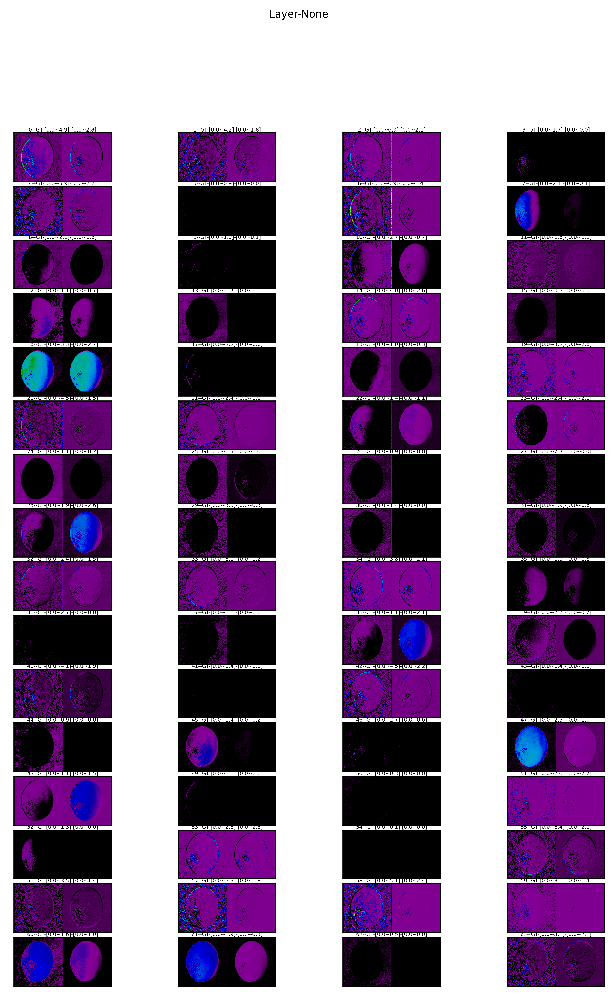

In [14]:
visualize_features_map_for_comparision(img_index=0, layer_index=selected_layer,
                                       features_map=conv_output, 
                                       opt_feature_map=opt_feature_map, cols=4, 
                                       conv_output_index_dict=conv_output_indexes_dict, 
                                       save_dict=save_dict, 
                                       plt_mode="img_scale",
                                       color_map="nipy_spectral", 
                                       is_save=False)